In [1]:
import pandas as pd
import geopandas
import plotly.express as px
import os
from geopandas import GeoDataFrame
from shapely.geometry import Point
import matplotlib.pyplot as plt
import imageio
import mapclassify
import matplotlib
import warnings
warnings.filterwarnings("ignore")
import matplotlib.image as mpimg
import ast
import json
import numpy as np
import shapely.wkt
import math

In [2]:
data_1 = pd.read_csv('/Volumes/xuyilun/课题/Human Dynamics/safegraph/GOOGLEDRIVES/data/first_step_data_with_competitors.csv').drop(
    columns = ['Unnamed: 0'])

data_1['geometry'] = data_1['geometry'].apply(lambda x: shapely.wkt.loads(x))
data_1['latitude'] = data_1['geometry'].apply(lambda x: x.y)
data_1['longitude'] = data_1['geometry'].apply(lambda x: x.x)

data = geopandas.GeoDataFrame(data_1, geometry=geopandas.points_from_xy(data_1.longitude, data_1.latitude))

In [3]:
data.shape

(284, 18)

In [4]:
keys = list(data[data['brands'] == 'Target']['safegraph_place_id'].unique())
color_range = list(np.linspace(0, 1, len(keys), endpoint=False))
colors = [plt.cm.tab20b(x) for x in color_range]
color_dict = dict(zip(keys, colors))

In [5]:
shp_path = '/Volumes/xuyilun/课题/Human Dynamics/safegraph/tl_2017_36_bg/tl_2017_36_bg.shp'
shp_df = geopandas.GeoDataFrame.from_file(shp_path,encoding = 'gb18030')

In [6]:
cbg_info = {}
cbg_id = shp_df['GEOID'].tolist()
cbg_geo = shp_df['geometry'].tolist()
for i in range(len(cbg_id)):
    cbg_info[cbg_id[i]] = cbg_geo[i]

In [7]:
visitors_2018 = pd.read_csv('/Volumes/xuyilun/课题/Human Dynamics/safegraph/PSO/yearly_visitors/All_stores_total_visitors_2018.csv').drop(
    columns = ['Unnamed: 0','total_visitors'], axis =1)
visitors_2018['cbg_geometry'] = visitors_2018['cbg'].apply(lambda x: cbg_info[str(x)])

In [8]:
competitors_info = pd.read_csv(
    '/Volumes/xuyilun/课题/Human Dynamics/safegraph/competitors_1030/places_info_nyc.csv')

In [9]:
target_info = data[data['brands'] == 'Target'][['safegraph_place_id', 'brands', 'latitude', 'longitude']]
comp_info = competitors_info[['safegraph_place_id', 'brands', 'latitude', 'longitude']]

In [10]:
store_info = pd.concat([target_info, comp_info])

In [11]:
store_info.shape

(290, 4)

In [12]:
table_2018 = pd.read_csv('/Volumes/圆滚滚/Different_versions_store_closure_performance/nyc/With_Staten_Island/table_2018.csv')
table_2019 = pd.read_csv('/Volumes/圆滚滚/Different_versions_store_closure_performance/nyc/With_Staten_Island/table_2019.csv')

In [13]:
table_2018['B_store'].nunique()

282

In [14]:
t_stores = list(data[data['brands'] == 'Target']['safegraph_place_id'].unique())
stores = list(table_2018['B_store'].unique())
comp_stores = [i for i in stores if i not in t_stores]

In [15]:
store_info = store_info[store_info['safegraph_place_id'].isin(stores)]

In [16]:
store_info.shape

(282, 4)

In [17]:
store_gdc = geopandas.GeoDataFrame(store_info, geometry=geopandas.points_from_xy(store_info.longitude, 
                                                                                 store_info.latitude))

In [18]:
#table_2018['B_store'].unique()

In [19]:
data = data[data['safegraph_place_id'].isin(list(table_2018['B_store'].unique()))]

In [33]:
temp.total_bounds

array([-74.25909 ,  40.477399, -73.700009,  40.917577])

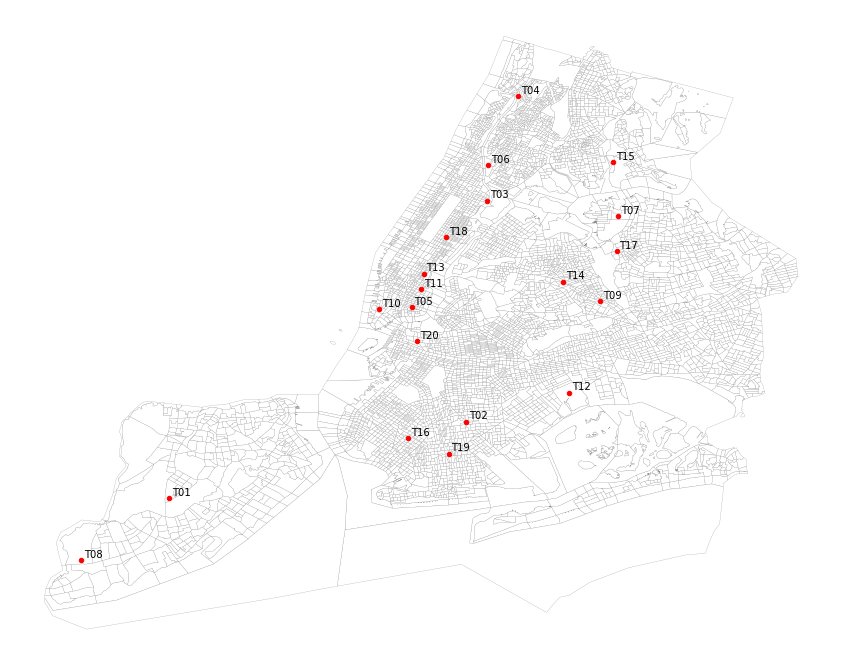

In [51]:
p = data.copy()
fig, ax = plt.subplots(1, 1, figsize=(18,12),subplot_kw=dict(aspect='equal'))
temp = visitors_2018.copy()
temp = GeoDataFrame(temp,geometry = 'cbg_geometry')
temp.plot(ax=ax, color='white', edgecolor='grey',linewidth=0.2)
p = p[p['brands'] == 'Target']
p.plot(ax=ax, marker='o', color = 'red', markersize=20)
#p = p[p['brands'] == 'Target']
for x, y, label,text in zip(p.geometry.x, p.geometry.y, p.safegraph_place_id, p['store-name']):
    ax.annotate(text, xy=(x, y), xytext=(3, 3), textcoords="offset points")
#plt.suptitle('Suggested Stores to be Closed',size = 20)
#plt.title('Target Stores in NYC' , size = 20, pad=20, loc='center')
plt.axis('off')

save_path = '/Volumes/xuyilun/课题/Human Dynamics/safegraph/GOOGLEDRIVES/figures/Target_Stores_in_NYC.png'
plt.savefig(save_path,dpi=200)

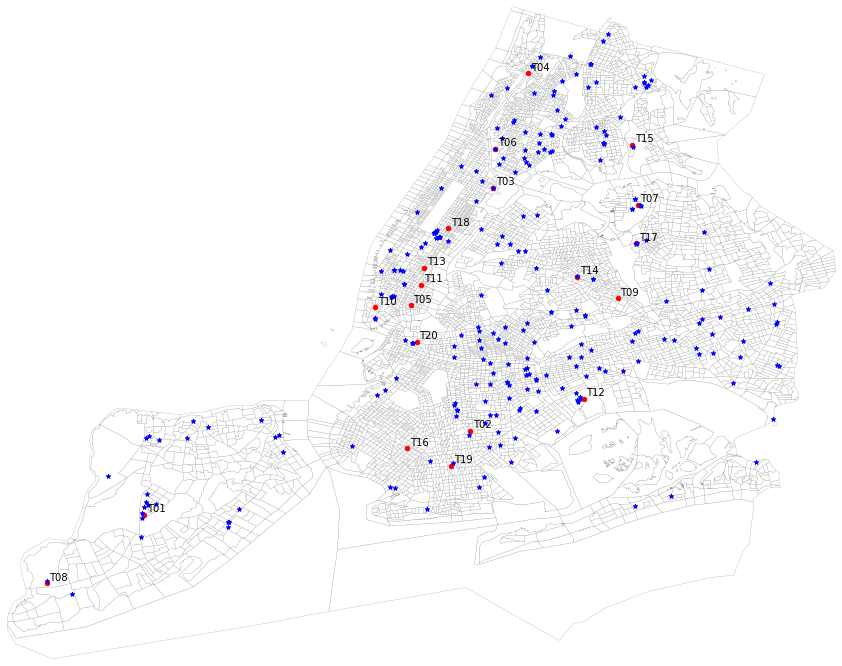

In [53]:
p = data.copy()
fig, ax = plt.subplots(1, 1, figsize=[18,12])
temp = visitors_2018.copy()
temp = GeoDataFrame(temp,geometry = 'cbg_geometry')
temp.plot(ax=ax, color='white', edgecolor='grey',linewidth=0.2, aspect = 'equal')
p = p[p['brands'] == 'Target']
p.plot(ax=ax, marker='o', color = 'red', markersize=20, aspect = 'equal')
c = store_gdc[store_gdc['safegraph_place_id'].isin(comp_stores)]
c.plot(ax=ax, color = 'blue', markersize=20, aspect = 'equal', marker='*')
#p = p[p['brands'] == 'Target']
for x, y, label,text in zip(p.geometry.x, p.geometry.y, p.safegraph_place_id, p['store-name']):
    ax.annotate(text, xy=(x, y), xytext=(3, 3), textcoords="offset points")
#plt.suptitle('Suggested Stores to be Closed',size = 20)
#plt.title('All Stores in NYC' , size = 20, pad=20, loc='center')
plt.axis('off')
minx, miny, maxx, maxy = temp.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
save_path = '/Volumes/xuyilun/课题/Human Dynamics/safegraph/GOOGLEDRIVES/figures/All_Stores_in_NYC.png'
plt.savefig(save_path,dpi=200)

In [32]:
d_2018 = pd.read_csv('/Volumes/xuyilun/课题/Human Dynamics/safegraph/paper/pred_vists_2018.csv')
d_2019 = pd.read_csv('/Volumes/xuyilun/课题/Human Dynamics/safegraph/paper/pred_vists_2019.csv')

In [33]:
d_2018['cbg_geometry'] = d_2018['cbg'].apply(lambda x: cbg_info[str(x)])
d_2019['cbg_geometry'] = d_2019['cbg'].apply(lambda x: cbg_info[str(x)])

In [34]:
d_2018 = GeoDataFrame(d_2018,geometry = 'cbg_geometry')
d_2019 = GeoDataFrame(d_2019,geometry = 'cbg_geometry')

In [35]:
cbgs_2018 = list(d_2018['cbg'].unique())
cbgs_2019 = list(d_2019['cbg'].unique())

In [36]:
d_2018_target = d_2018[d_2018['store'].isin(t_stores)]
d_2019_target = d_2019[d_2019['store'].isin(t_stores)]

In [46]:
d_2018_share = pd.read_csv(
    '/Volumes/xuyilun/课题/Human Dynamics/safegraph/paper/pred_vists_share_2018.csv').drop(
    columns=['pred_visits_share'])

d_2019_share = pd.read_csv(
    '/Volumes/xuyilun/课题/Human Dynamics/safegraph/paper/pred_vists_share_2019.csv').drop(
    columns=['pred_visits_share'])

In [43]:
def get_sum_visits_by_cbg(df, year):
    dict_here = {}
    if year == 2018:
        cbgs = cbgs_2018.copy()
    if year == 2019:
        cbgs = cbgs_2019.copy()
    for c in cbgs:
        d_here = df[df['cbg'] == c]
        pred_visits_sum = d_here['pred_visits'].sum()
        dict_here[c] = pred_visits_sum
    return dict_here

In [44]:
def get_sum_visits_by_store(df, year):
    dict_here = {}
    if year == 2018:
        cbgs = cbgs_2018.copy()
    if year == 2019:
        cbgs = cbgs_2019.copy()
    for t in t_stores:
        d_here = df[df['store'] == t]
        pred_visits_sum = d_here['pred_visits'].sum()
        dict_here[t] = pred_visits_sum
    return dict_here

In [45]:
total_visits_by_cbg_2018 = get_sum_visits_by_cbg(d_2018_target, 2018)
total_visits_by_cbg_2019 = get_sum_visits_by_cbg(d_2019_target, 2019)
total_visits_by_store_2018 = get_sum_visits_by_store(d_2018_target, 2018)
total_visits_by_store_2019 = get_sum_visits_by_store(d_2019_target, 2019)

In [52]:
def get_pred_share_by_cbg(df, year):
    d = df.copy()
    ans = []
    for i,cont in df.iterrows():
        if year == 2018:
            pred_visits_sum = total_visits_by_cbg_2018[cont.cbg]
        if year == 2019:
            pred_visits_sum = total_visits_by_cbg_2019[cont.cbg]
        if pred_visits_sum != 0:
            ans.append(min(cont.pred_visits/pred_visits_sum, 1))
        else:
            ans.append(0)
    print('ok')
    return ans

In [53]:
def get_pred_share_by_store(df, year):
    d = df.copy()
    ans = []
    for i,cont in df.iterrows():
        if year == 2018:
            pred_visits_sum = total_visits_by_store_2018[cont.store]
        if year == 2019:
            pred_visits_sum = total_visits_by_store_2019[cont.store]
        if pred_visits_sum != 0:
            ans.append(min(cont.pred_visits/pred_visits_sum, 1))
        else:
            ans.append(0)
    print('ok')
    return ans

In [55]:
d_2018_share['pred_visits_share_by_cbg'] = get_pred_share_by_cbg(d_2018_share, 2018)
d_2019_share['pred_visits_share_by_cbg'] = get_pred_share_by_cbg(d_2019_share, 2019)
d_2018_share['pred_visits_share_by_store'] = get_pred_share_by_store(d_2018_share, 2018)
d_2019_share['pred_visits_share_by_store'] = get_pred_share_by_store(d_2019_share, 2019)

ok
ok
ok
ok


In [58]:
d_2018_share['color'] = d_2018_share['store'].apply(lambda x: color_dict[x])
d_2019_share['color'] = d_2019_share['store'].apply(lambda x: color_dict[x])

In [61]:
d_2018_share.to_csv('/Volumes/xuyilun/课题/Human Dynamics/safegraph/paper/pred_vists_share_2018.csv')
d_2019_share.to_csv('/Volumes/xuyilun/课题/Human Dynamics/safegraph/paper/pred_vists_share_2019.csv')

In [72]:
d_2018_share['cbg_geometry'] = d_2018_share['cbg'].apply(lambda x: cbg_info[str(x)])
d_2019_share['cbg_geometry'] = d_2019_share['cbg'].apply(lambda x: cbg_info[str(x)])

In [73]:
d_2018_share = GeoDataFrame(d_2018_share,geometry = 'cbg_geometry')
d_2019_share = GeoDataFrame(d_2019_share,geometry = 'cbg_geometry')

In [145]:
def get_image_by_store(da, year, t):
    
    if year == 2018:
        cbgs = cbgs_2018.copy()
    if year == 2019:
        cbgs = cbgs_2019.copy()
        
    p = data.copy()
    fig, ax = plt.subplots(1, 1, figsize=[15,10])
    temp = visitors_2018.copy()
    temp = GeoDataFrame(temp,geometry = 'cbg_geometry')
    temp.plot(ax=ax, color='white', edgecolor='black',linewidth=0.2)
    da_temp = da[da['store'] == t]

    da_temp.plot(ax=ax, column = 'pred_visits_share_by_store', cmap='Reds',
                 legend=True, scheme="User_Defined", classification_kwds=dict(
                     bins=[0.01, 0.02, 0.05, 0.1, 1]))
    
    p = p[p['brands'] == 'Target']    
    chosen_target = p[p['safegraph_place_id'] == t]
    chosen_target.plot(ax = ax, marker = '*', markersize = 30, color = 'gold')
    
    n = p[p['safegraph_place_id'] != t]
    n.plot(ax=ax, marker='o', color = 'red', markersize=20)
    '''
    da_temp.plot(ax=ax, column = 'pred_visits_share_by_store', cmap='OrRd',
                 legend=True, scheme="quantiles")
    '''
    '''
    t.plot(ax=ax, column = 'pred_visits_share',color=color_dict[row['level_1']], legend=True, 
               scheme="User_Defined", 
              classification_kwds=dict(bins=[0, 0.25, 0.5, 0.75, 1]))
    '''
    
    for x, y, label,text in zip(p.geometry.x, p.geometry.y, p.safegraph_place_id, p['store-name']):
        ax.annotate(text, xy=(x, y), xytext=(3, 3), textcoords="offset points")
    
    plt.suptitle("Target Stores Coverage",size = 20)
    plt.title(t + ', '+ str(year), size = 15, pad=20, loc='center')
    plt.axis('off')
    if ':' in t:
        save_path = '/Volumes/xuyilun/课题/Human Dynamics/safegraph/paper/figures/Target Coverage (by store)/'+str(
            year)+'/'+ t[3:] + '.png'
    else:
        save_path = '/Volumes/xuyilun/课题/Human Dynamics/safegraph/paper/figures/Target Coverage (by store)/'+str(
            year)+'/'+ t + '.png'
    plt.savefig(save_path,dpi=100)

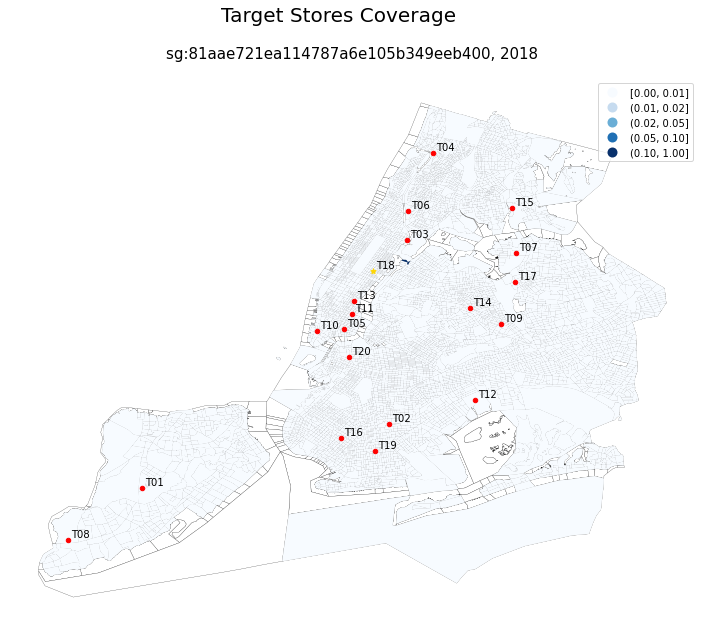

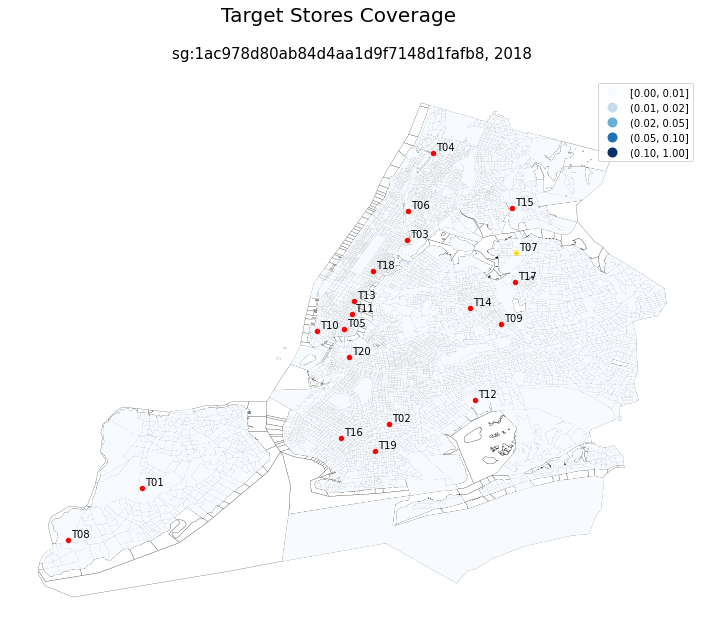

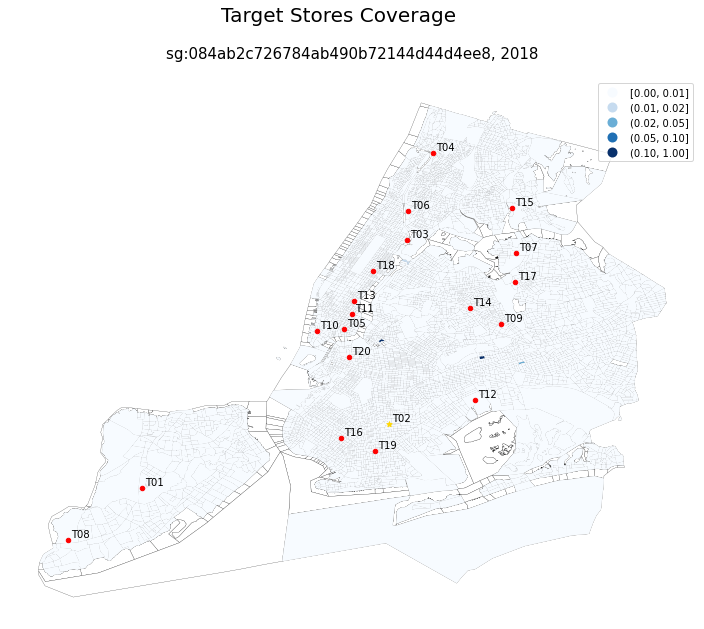

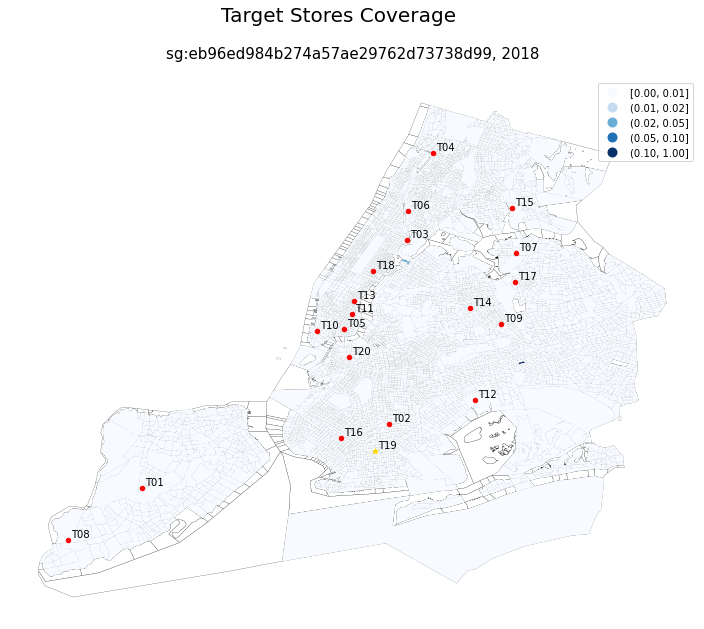

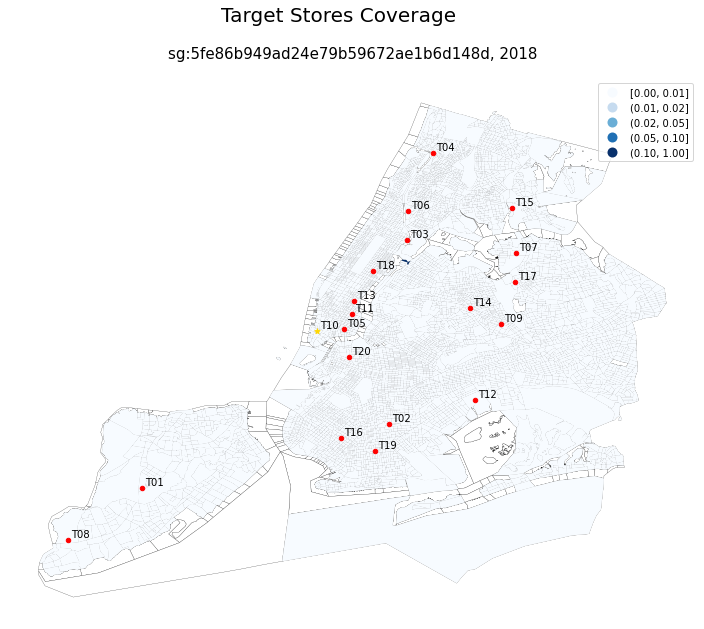

...

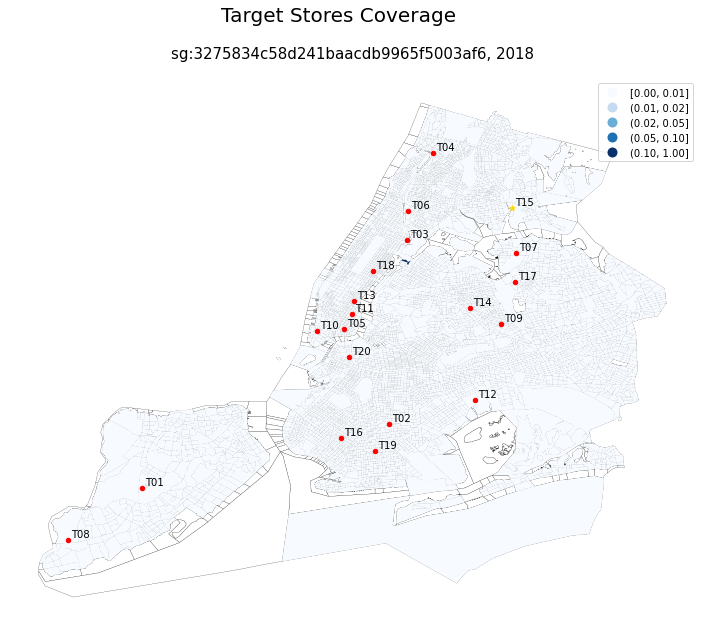

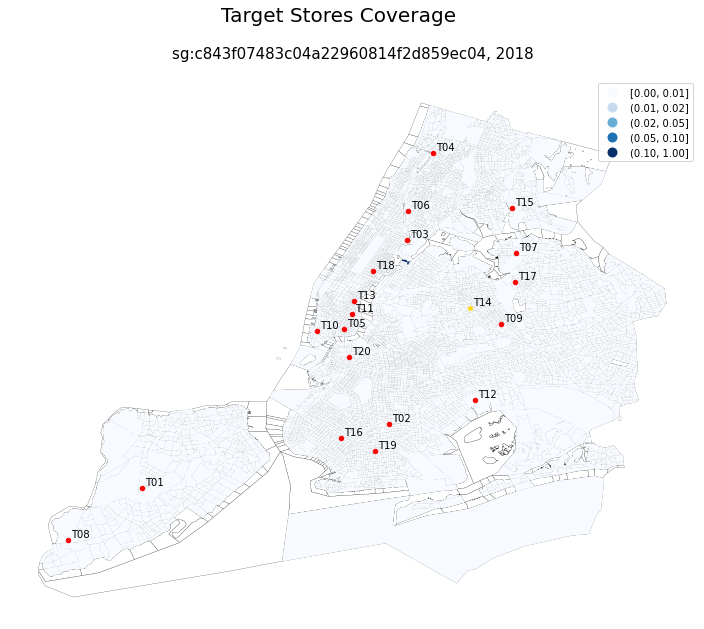

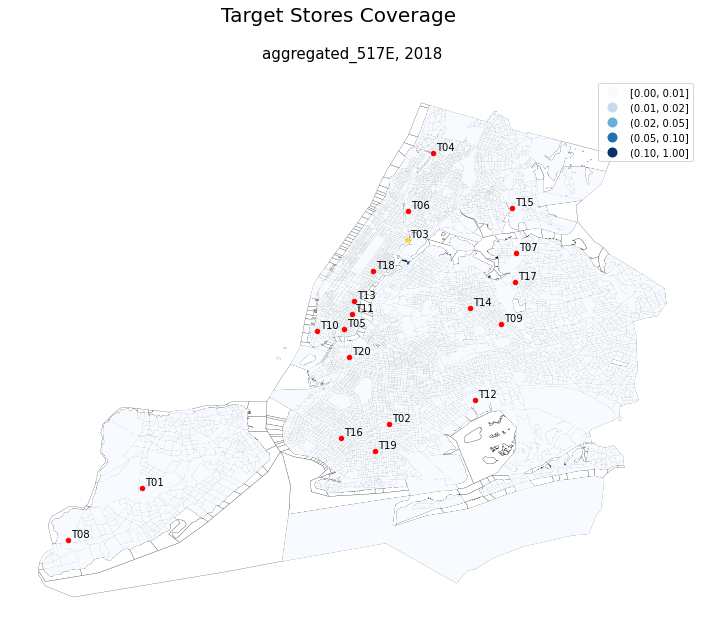

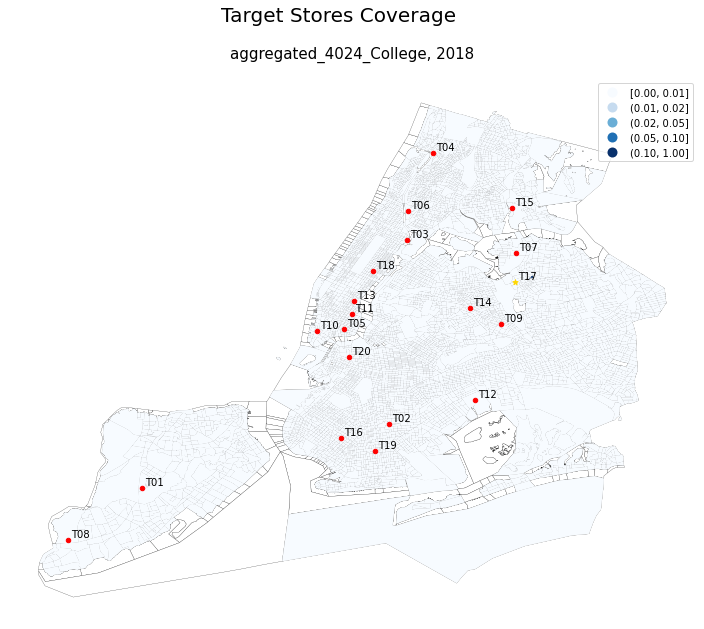

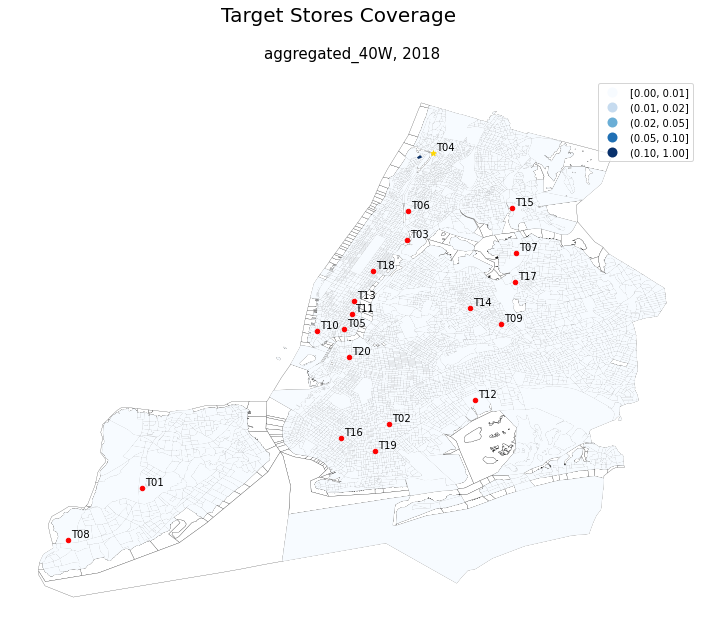

In [146]:
for t in t_stores:
    get_image_by_store(d_2018_share, 2018, t)

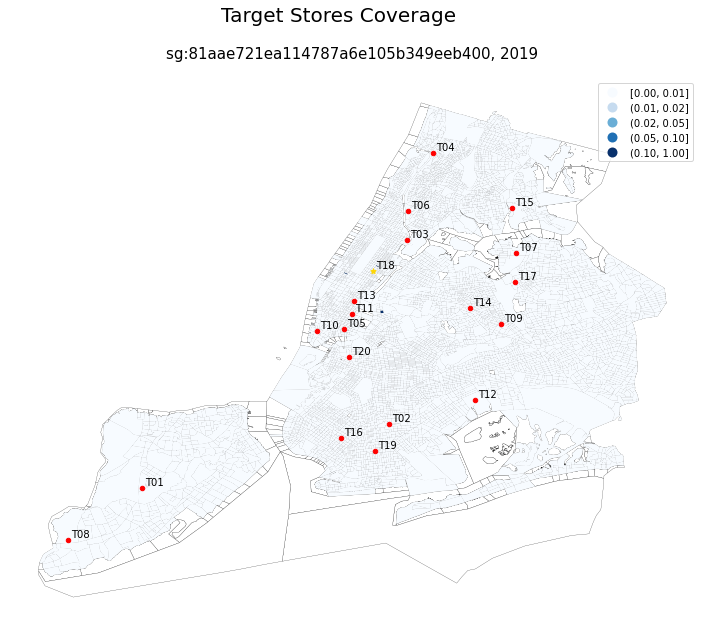

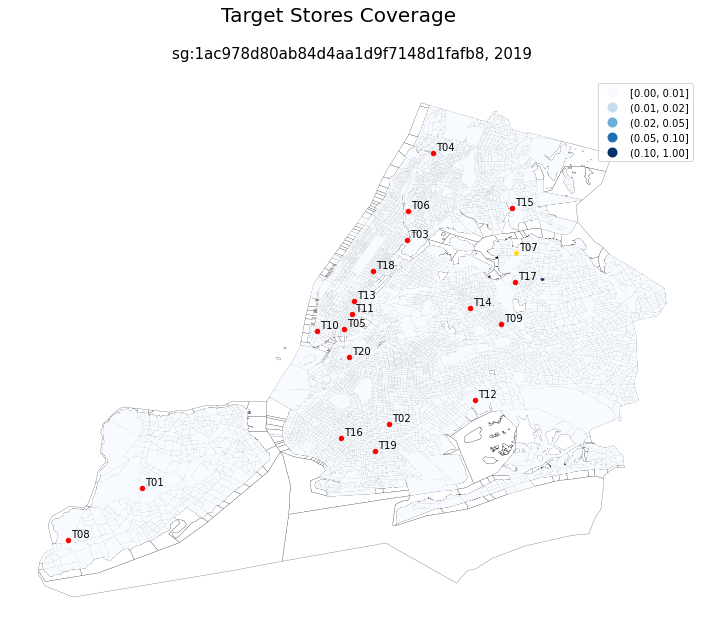

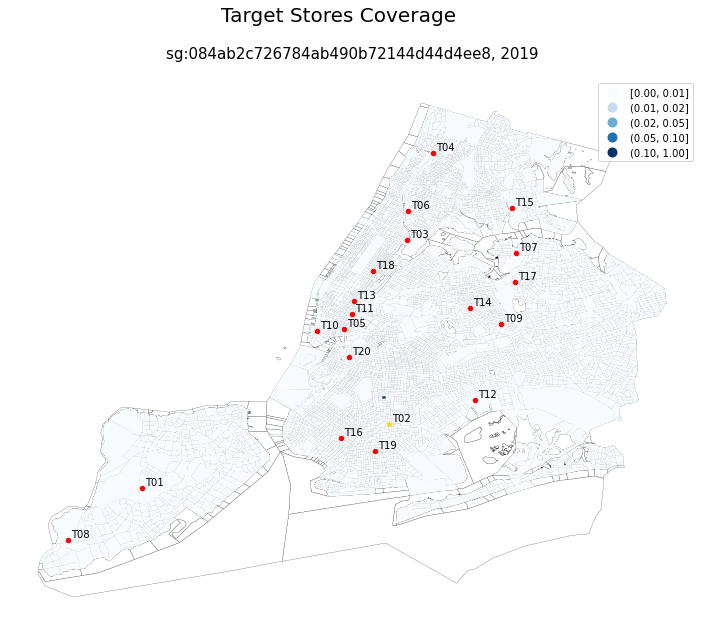

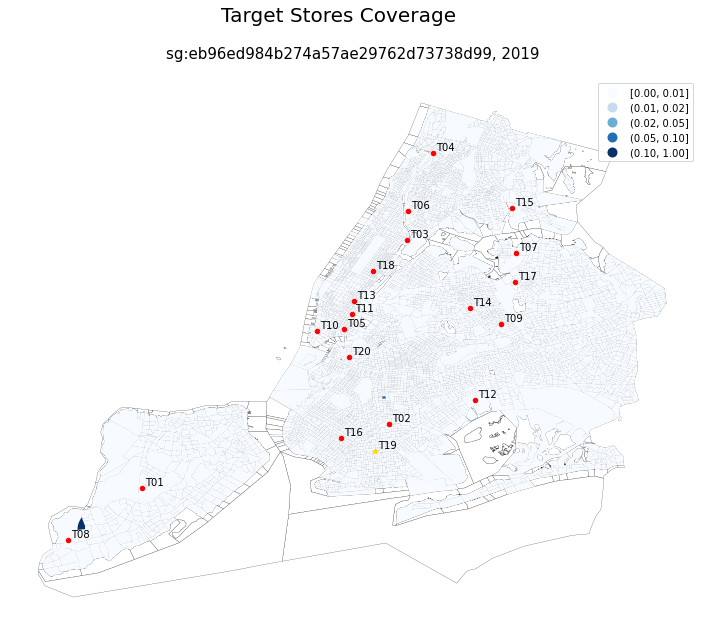

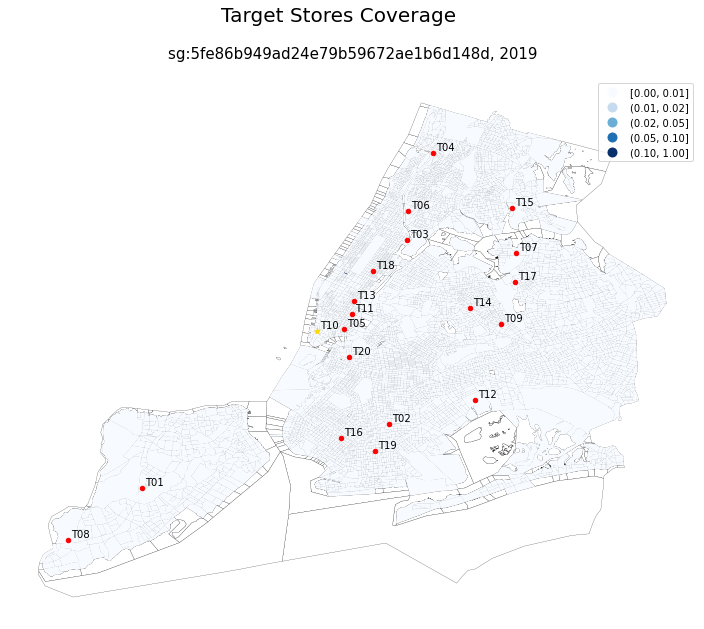

...

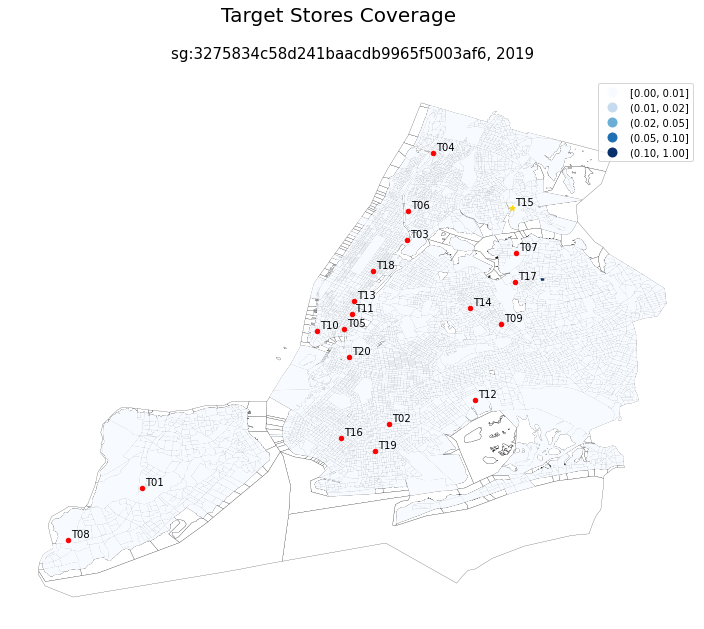

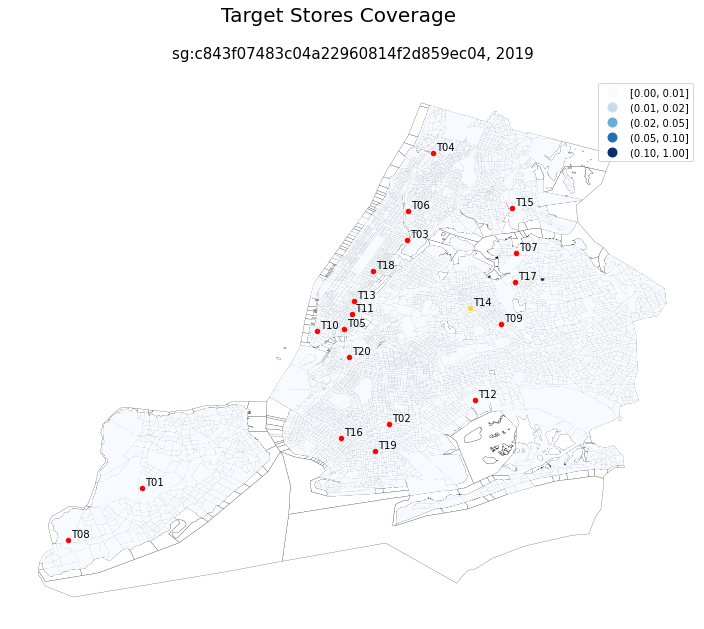

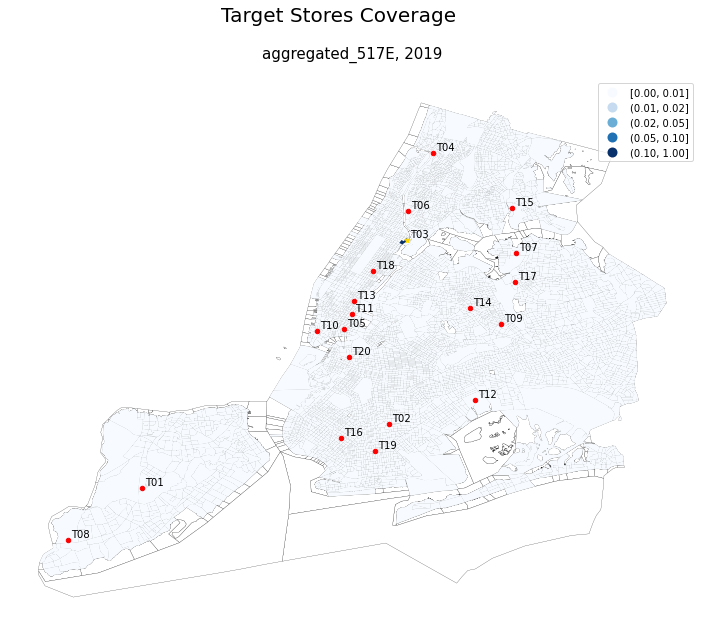

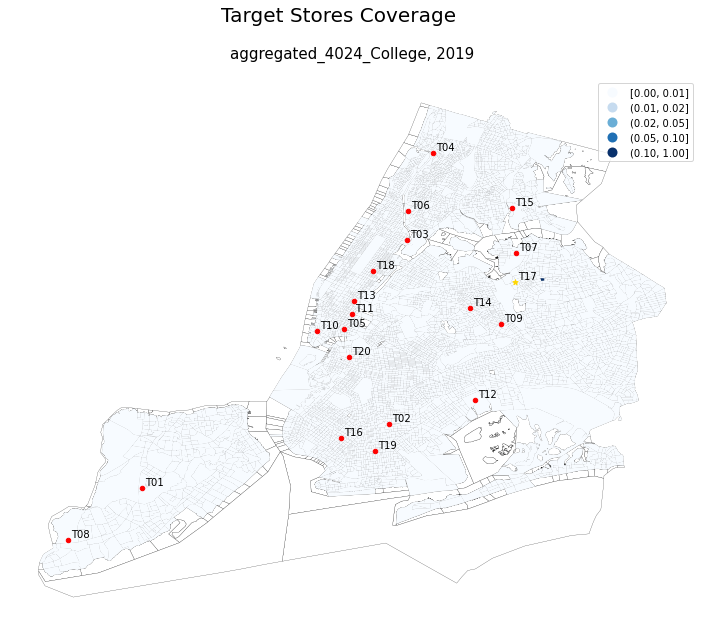

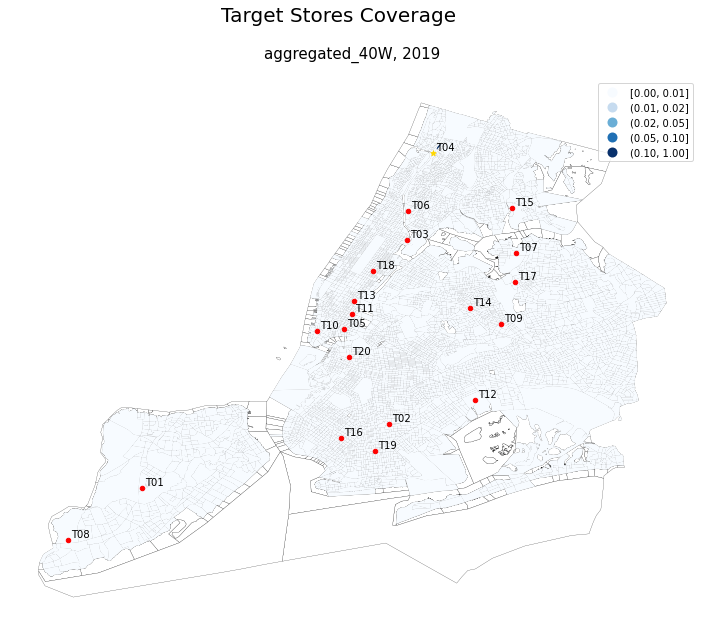

In [147]:
for t in t_stores:
    get_image_by_store(d_2019_share, 2019, t)